In [1]:
import cv2
import numpy as np

In [2]:
# Setting up some constants
test_folder = "test_images"
calibration_folder = "camera_cal"
NX = 9 # Number of inside chessboard corners in X axis
NY = 6 # Number of inside chessboard corners in Y axis

In [3]:
import glob
# Using glob to get list of files in folder
test_list = glob.glob(test_folder + '/*.jpg')
cal_list = glob.glob(calibration_folder + '/*.jpg')

In [4]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

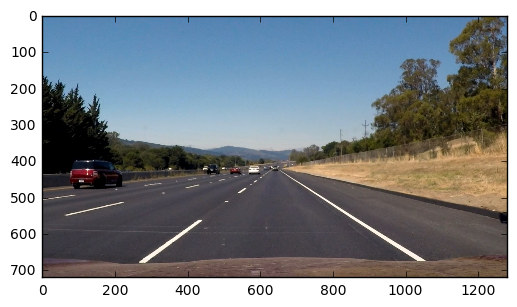

In [5]:
# Image example from test folder
lanes_image = mpimg.imread(test_list[1])
img_size = lanes_image.shape
plt.imshow(lanes_image)

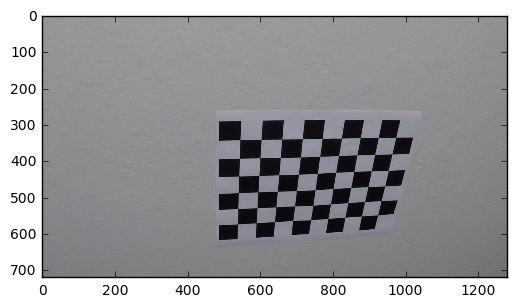

In [6]:
# Read and show distorted chessboard image from calibration folder
cb_image = mpimg.imread(cal_list[1])
plt.imshow(cb_image)

In [7]:
def get_camera_calibration(cal_list):
    # Get list of 2D coordinated for 3D points on chessboard images
    objpoints = []
    imgpoints = []
    offset = 100
    objp = np.zeros((NX*NY, 3), np.float32)
    objp[:, :2] = np.mgrid[0:NX, 0:NY].T.reshape(-1,2)
    for cb in cal_list:
        img = mpimg.imread(cb)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (NX, NY), None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (1280, 720), None, None)
    return ret, mtx, dist, rvecs, tvecs

ret, mtx, dist, rvecs, tvecs = get_camera_calibration(cal_list)

In [8]:
def plot_2_images(img1, img2, caption1, caption2):
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img1, cmap='gray')
        ax1.set_title(caption1, fontsize=40)
        ax2.imshow(img2, cmap='gray')
        ax2.set_title(caption2, fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

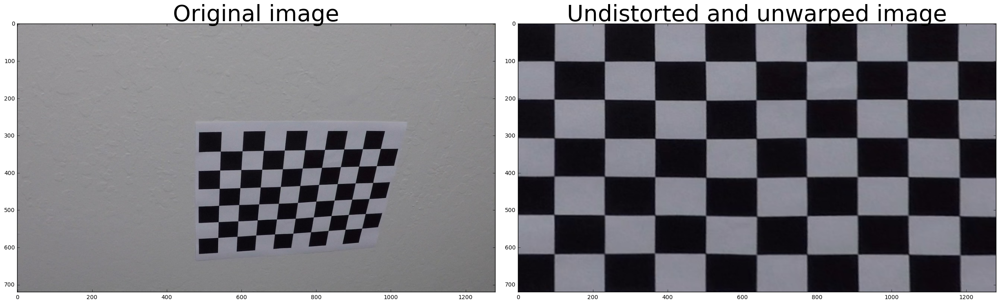

In [9]:
# Lets undistort and unwarp the image above
undist = cv2.undistort(cb_image, mtx, dist, None, mtx)
gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
offset = 100
ret, corners = cv2.findChessboardCorners(gray, (NX, NY), None)
if ret == True:
        img_size = (gray.shape[1], gray.shape[0])
        src = np.float32([corners[0], corners[NX-1], corners[-1], corners[-NX]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(undist, M, img_size)
        plot_2_images(cb_image, warped, 'Original image', 'Undistorted and unwarped image')

In [10]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

In [11]:
lanes_sob_abs_x = abs_sobel_thresh(lanes_image, thresh_min=10, thresh_max=255)
lanes_sob_abs_y = abs_sobel_thresh(lanes_image, thresh_min=10, thresh_max=255, orient='y')

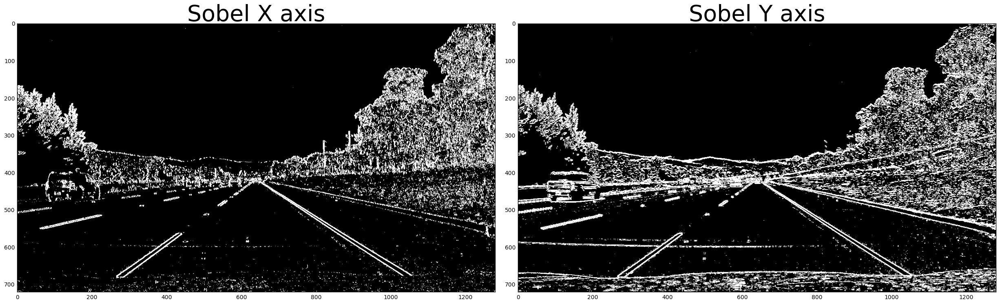

In [12]:
plot_2_images(lanes_sob_abs_x, lanes_sob_abs_y, 'Sobel X axis', 'Sobel Y axis')

In [13]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [14]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [15]:
sobel_mag = mag_thresh(lanes_image, mag_thresh=(40, 255))
sobel_dir = dir_threshold(lanes_image, thresh=(np.pi/8, np.pi/3))

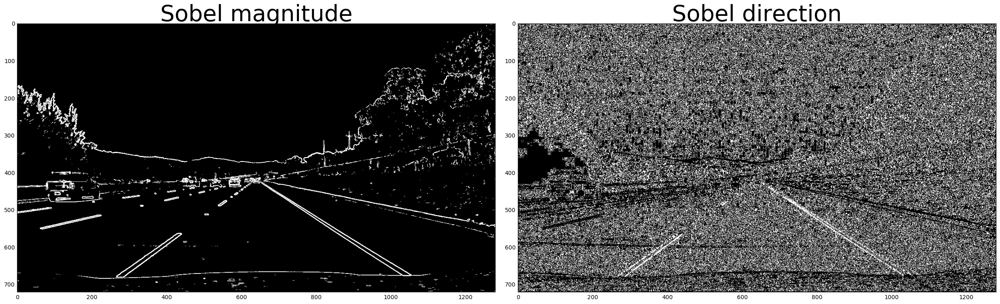

In [16]:
plot_2_images(sobel_mag, sobel_dir, 'Sobel magnitude', 'Sobel direction')

In [17]:
def color_thresh(img, h_thresh=(15, 100), s_thresh=(1, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    binary = np.zeros_like(H)
    binary[((H>=h_thresh[0]) & (H<=h_thresh[1])) & ((S>=s_thresh[0]) & (S<=s_thresh[1]))] = 1
    return binary

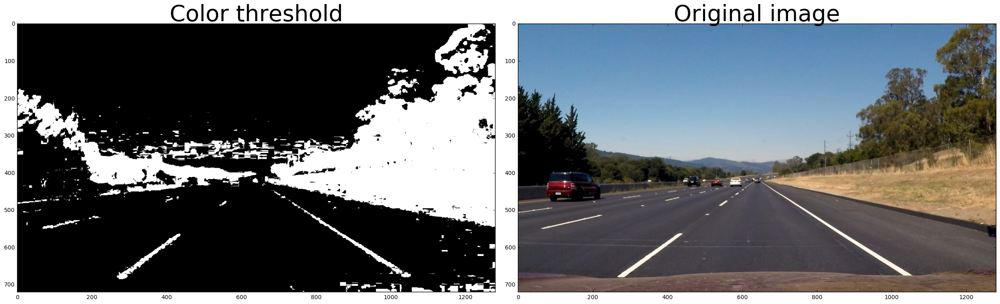

In [18]:
clr_thresh = color_thresh(lanes_image)
plot_2_images(clr_thresh, lanes_image, 'Color threshold', 'Original image')

In [19]:
def thresh_combined(img):
    gradx = abs_sobel_thresh(img, thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, thresh_min=20, thresh_max=100, orient='y')
    mag_binary = mag_thresh(img, mag_thresh=(70, 150))
    dir_binary = dir_threshold(img, thresh=(np.pi/8, np.pi/3))
    clr_thresh = color_thresh(img, s_thresh = (130, 255), h_thresh=(15, 100))
    combined = np.zeros_like(dir_binary)
    combined[(gradx == 1) & 
             (grady == 1) & 
             (dir_binary == 1) | 
             (mag_binary == 1) | 
             (clr_thresh == 1) |
             (gradx == 1)] = 1
    return combined

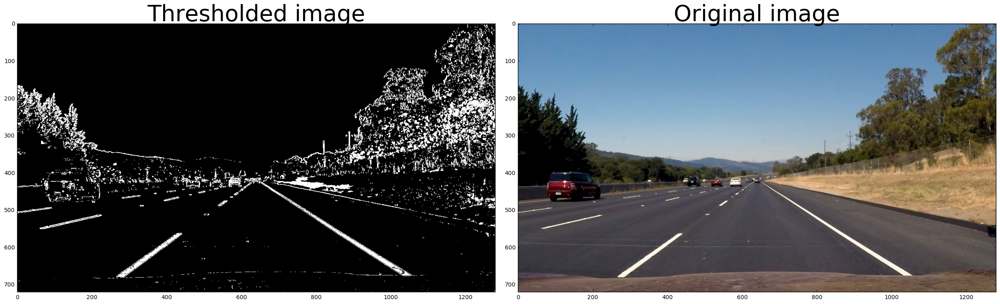

In [20]:
comb_lanes = thresh_combined(lanes_image)
plot_2_images(comb_lanes, lanes_image, 'Thresholded image', 'Original image')

In [21]:
# Source points, definig road plane
src = np.float32([[594, 450], [687, 450],  [1050, 675], [282, 675]])
#src = np.float32([[594, 450], [685, 450],  [1050, 675], [260, 675]])

def pipeline(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    thr = thresh_combined(undist)
    img_size = thr.shape[0:2][::-1]
    h_offset = 250
    v_offset = 100
    dst = np.float32([[h_offset, v_offset], [img_size[0]-h_offset, v_offset], 
                                     [img_size[0]-h_offset, img_size[1]-v_offset], 
                                     [h_offset, img_size[1]-v_offset]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(thr, M, img_size)
    #warped_undist = cv2.warpPerspective(undist, M, img_size)
    return warped

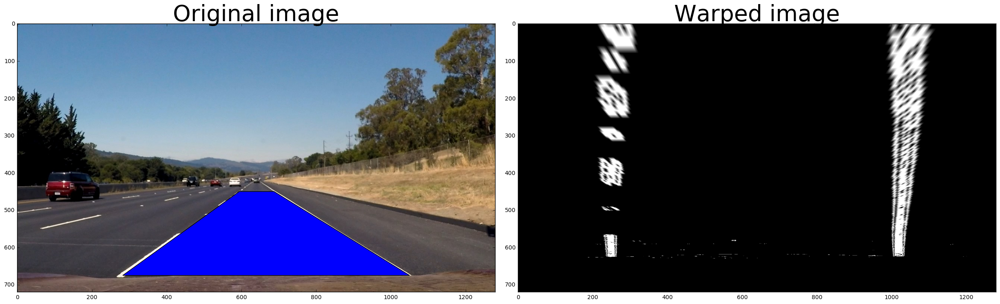

In [23]:
from matplotlib.patches import Polygon
binary_warped = pipeline(lanes_image)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(lanes_image, cmap='gray')
ax1.set_title('Original image', fontsize=40)
ax2.imshow(binary_warped, cmap='gray')
ax2.set_title('Warped image', fontsize=40)
polygon = Polygon(src, True)
ax1.add_patch(polygon)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

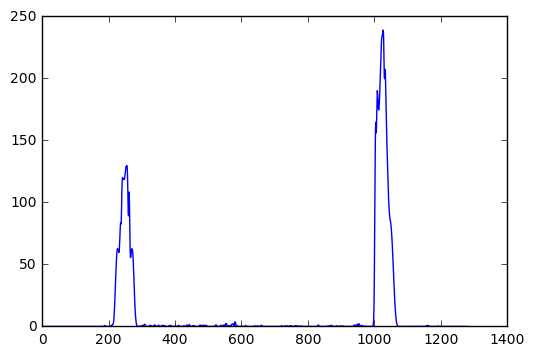

In [24]:
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

(720, 0)

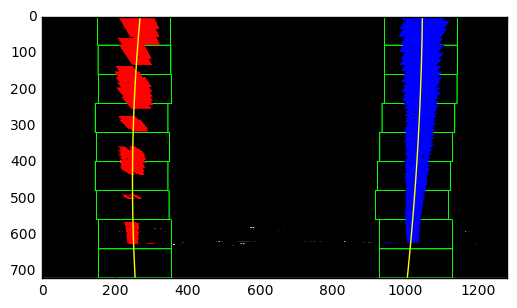

In [25]:
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
gray = np.uint8(binary_warped*255)
out_img = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]//nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),color=(0,255,0), thickness=2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),color=(0,255,0), thickness=2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(720, 0)

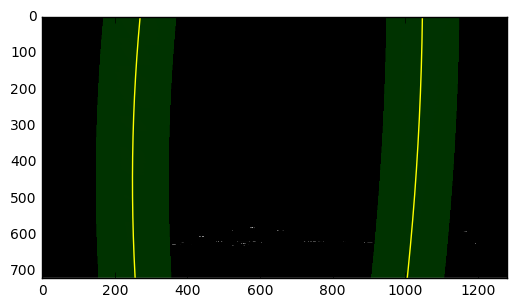

In [26]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [ ]:
for img_name in test_list:
    image = mpimg.imread(img_name)
    thr = pipeline(image)
    mpimg.imsave("output_images/" + img_name.split('\\')[-1] + "_processed.jpg", thr, cmap='gray')